In [78]:
import IPython
from scipy.io import wavfile
import noisereduce as nr
import soundfile as sf
from noisereduce.generate_noise import band_limited_noise
import matplotlib.pyplot as plt
import urllib.request
import numpy as np
import io
%matplotlib inline

In [114]:
#url = "https://raw.githubusercontent.com/timsainb/noisereduce/master/assets/fish.wav"
#url = "https://github.com/iyappan04/noise/blob/main/long_audio_2.wav"
#response = urllib.request.urlopen(url)
data, rate = sf.read('/home/iyappan/Music/noise_audio/long_audio_2.wav')
data = data
# print(data)

In [115]:
IPython.display.Audio(data=data, rate=rate)

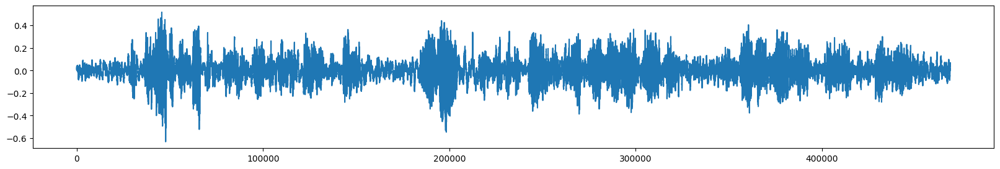

In [116]:
fig, ax = plt.subplots(figsize=(20,3))
ax.plot(data)

In [117]:
noise_len = 2 # seconds
noise = band_limited_noise(min_freq=2000, max_freq = 12000, samples=len(data), samplerate=rate)*10
noise_clip = noise[:rate*noise_len]
audio_clip_band_limited = data+noise

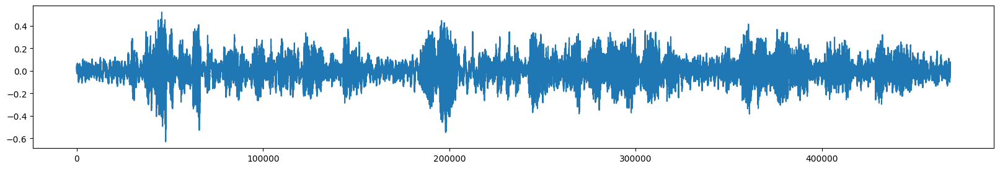

In [118]:
fig, ax = plt.subplots(figsize=(20,3))
ax.plot(audio_clip_band_limited)

In [119]:
IPython.display.Audio(data=audio_clip_band_limited, rate=rate)

In [120]:
reduced_noise = nr.reduce_noise(y = audio_clip_band_limited, sr=rate, n_std_thresh_stationary=1.5,stationary=True)

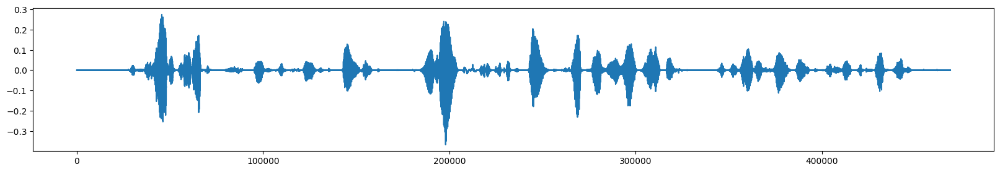

In [121]:
fig, ax = plt.subplots(figsize=(20,3))
ax.plot(reduced_noise)

In [122]:
IPython.display.Audio(data=reduced_noise, rate=rate)

In [123]:
reduced_noise = nr.reduce_noise(y = audio_clip_band_limited, sr=rate, thresh_n_mult_nonstationary=2,stationary=False)

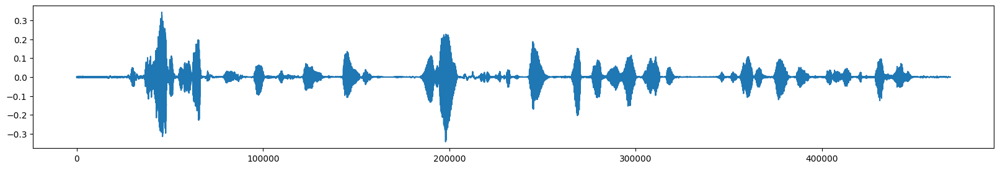

In [124]:
fig, ax = plt.subplots(figsize=(20,3))
ax.plot(reduced_noise)

In [125]:
IPython.display.Audio(data=reduced_noise, rate=rate)

In [127]:
# url = "https://raw.githubusercontent.com/timsainb/noisereduce/master/assets/cafe_short.wav"
# response = urllib.request.urlopen(url)
noise_data, noise_rate = sf.read('/home/iyappan/Music/noise_audio/long_audio_2.wav')

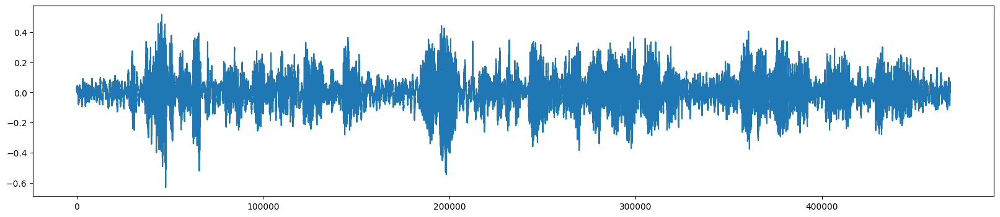

In [128]:
fig, ax = plt.subplots(figsize=(20,4))
ax.plot(noise_data)

In [129]:
IPython.display.Audio(data=noise_data, rate=rate)

In [130]:
snr = 2 # signal to noise ratio
noise_clip = noise_data/snr
audio_clip_cafe = data + noise_clip

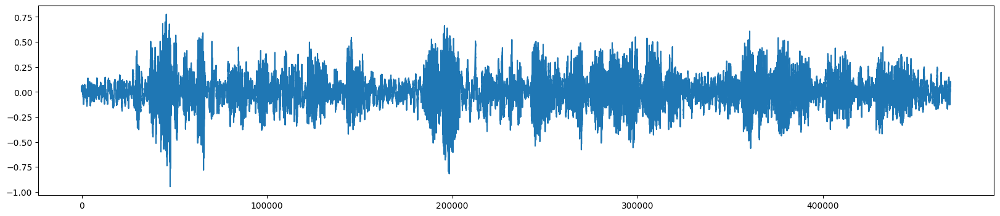

In [131]:
fig, ax = plt.subplots(figsize=(20,4))
ax.plot(audio_clip_cafe)
IPython.display.Audio(data=audio_clip_cafe, rate=noise_rate)

In [132]:
reduced_noise = nr.reduce_noise(y = audio_clip_cafe, sr=rate, y_noise = noise_clip, n_std_thresh_stationary=1.5,stationary=True)

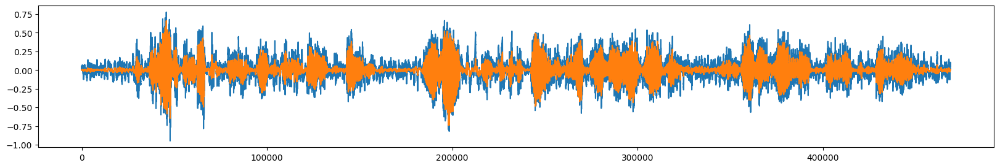

In [133]:
fig, ax = plt.subplots(figsize=(20,3))
ax.plot(audio_clip_cafe)
ax.plot(reduced_noise)

In [134]:
IPython.display.Audio(data=reduced_noise, rate=rate)

In [135]:
reduced_noise = nr.reduce_noise(y = audio_clip_cafe, sr=rate, thresh_n_mult_nonstationary=2,stationary=False)

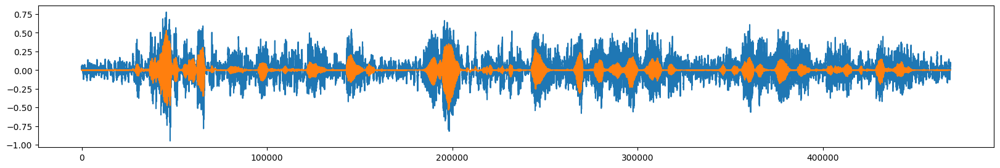

In [136]:
fig, ax = plt.subplots(figsize=(20,3))
ax.plot(audio_clip_cafe)
ax.plot(reduced_noise, alpha = 1)
IPython.display.Audio(data=reduced_noise, rate=rate)

In [137]:
IPython.display.Audio(data=reduced_noise, rate=rate)

In [138]:
noise_reduced = nr.reduce_noise(y=data, sr=rate, prop_decrease=0, stationary=False)

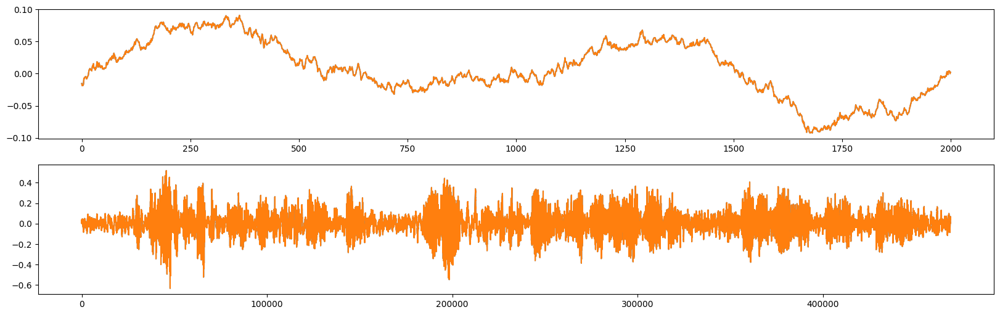

In [139]:
fig, axs = plt.subplots(nrows=2, figsize=(20,6))
axs[0].plot(data[3000:5000])
axs[0].plot(noise_reduced[3000:5000])
axs[1].plot(data)
axs[1].plot(noise_reduced)

In [140]:
noise_reduced = nr.reduce_noise(y=data, sr=rate, prop_decrease=0, stationary=False)

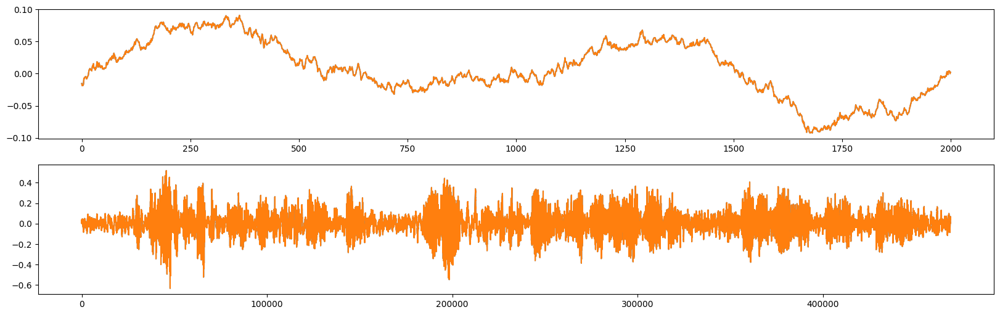

In [141]:
fig, axs = plt.subplots(nrows=2, figsize=(20,6))
axs[0].plot(data[3000:5000])
axs[0].plot(noise_reduced[3000:5000])
axs[1].plot(data)
axs[1].plot(noise_reduced)

In [142]:
long_data = np.tile(data, 10)
len(long_data)/rate

97.68854166666667

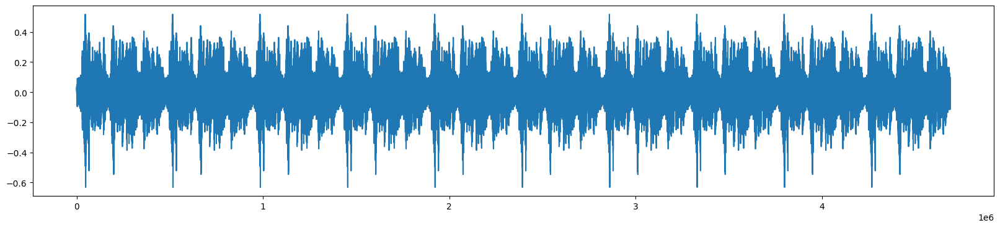

In [143]:
fig, ax = plt.subplots(figsize=(20,4))
ax.plot(long_data)

In [144]:
noise = band_limited_noise(min_freq=2000, max_freq = 12000, samples=len(long_data), samplerate=rate)*10
audio_clip_band_limited = long_data+noise

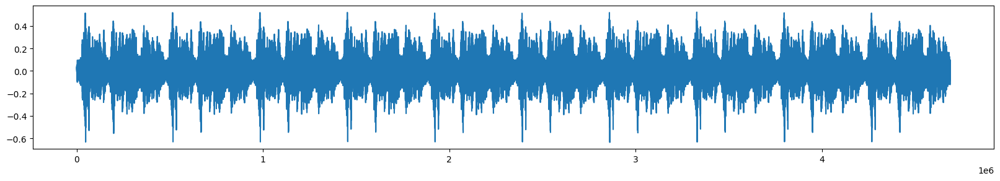

In [145]:
fig, ax = plt.subplots(figsize=(20,3))
ax.plot(audio_clip_band_limited)

In [146]:
reduced_noise = nr.reduce_noise(
    y=audio_clip_band_limited,
    sr=rate,
    thresh_n_mult_nonstationary=2,
    stationary=False,
    n_jobs=2,
)

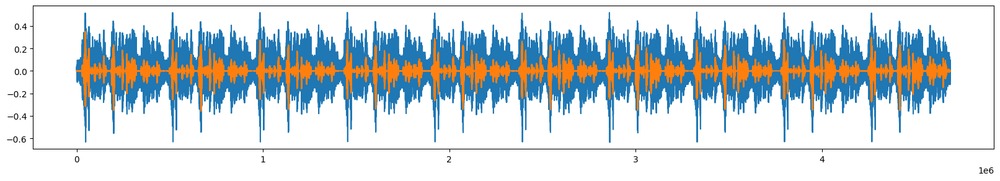

In [147]:
fig, ax = plt.subplots(figsize=(20,3))
ax.plot(audio_clip_band_limited)
ax.plot(reduced_noise)

In [148]:
reduced_noise = nr.reduce_noise(
    y=audio_clip_band_limited,
    sr=rate,
    thresh_n_mult_nonstationary=2,
    stationary=True,
    n_jobs=2,
)

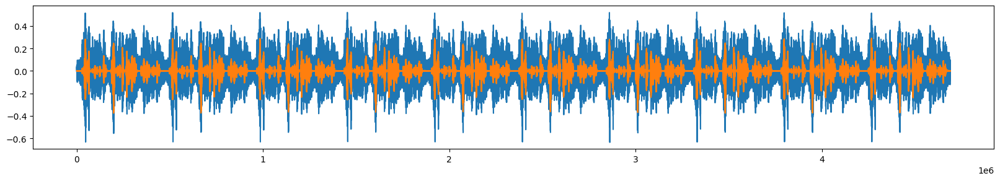

In [149]:
fig, ax = plt.subplots(figsize=(20,3))
ax.plot(audio_clip_band_limited)
ax.plot(reduced_noise)

In [150]:
from noisereduce.noisereduce import SpectralGateStationary

In [151]:
sg = SpectralGateStationary(
    y = data,
    sr = rate,
    y_noise=None,
    prop_decrease=1.0,
    time_constant_s=2.0,
    freq_mask_smooth_hz=500,
    time_mask_smooth_ms=50,
    n_std_thresh_stationary=1.5,
    tmp_folder=None,
    chunk_size=600000,
    padding=30000,
    n_fft=1024,
    win_length=None,
    hop_length=None,
    clip_noise_stationary=True,
    use_tqdm=False,
    n_jobs=1,
)

In [152]:
subset_noise_reduce = sg.get_traces(start_frame = 10000, end_frame = 20000)

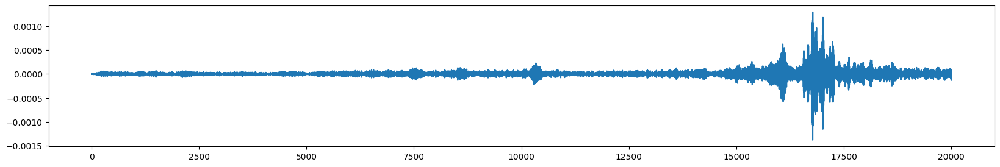

In [153]:
fig, ax = plt.subplots(figsize=(20,3))
ax.plot(subset_noise_reduce)

In [154]:
audio_clip_cafe_2_channel = np.vstack([audio_clip_cafe, audio_clip_cafe])
audio_clip_cafe_2_channel.shape

(2, 468905)

In [155]:
reduced_noise = nr.reduce_noise(y = audio_clip_cafe_2_channel, sr=rate, n_std_thresh_stationary=1.5,stationary=True)

In [156]:
reduced_noise.shape

(2, 468905)

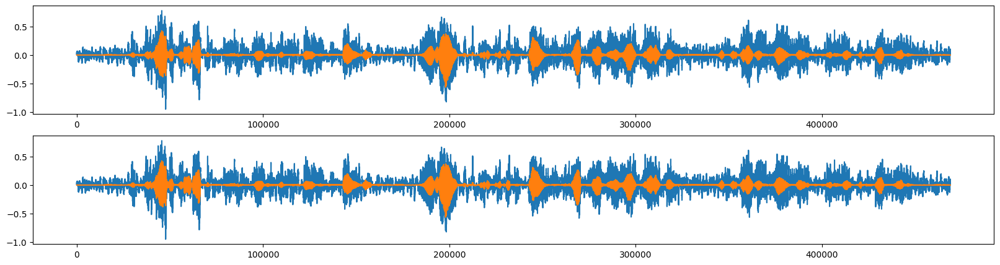

In [157]:
fig, axs = plt.subplots(nrows= 2, figsize=(20,5))
axs[0].plot(audio_clip_cafe_2_channel[0])
axs[1].plot(audio_clip_cafe_2_channel[1])

axs[0].plot(reduced_noise[0])
axs[1].plot(reduced_noise[1])

In [159]:
IPython.display.Audio(data=reduced_noise, rate=rate)

In [160]:
reduced_noise = nr.reduce_noise(y = audio_clip_cafe, sr=rate, thresh_n_mult_nonstationary=2,stationary=False)

In [161]:
reduced_noise.shape

(468905,)

In [162]:
IPython.display.Audio(data=reduced_noise, rate=rate)

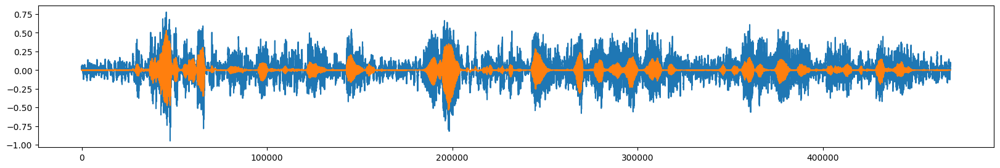

In [163]:
fig, ax = plt.subplots(figsize=(20,3))
ax.plot(audio_clip_cafe)
ax.plot(reduced_noise, alpha = 1)
IPython.display.Audio(data=reduced_noise, rate=rate)